# Склеивание изображений

Будем использовать алгоритм с практики:
1.   Обнаружить особые точки и получить их дескрипторы.
2.   Обнаружить сопадающие точки, присутствующие на обоих изображениях.
3.   Применить алгоритм RANSAC для улучшения сопоставления точек.
4.   Применить перспективное преобразование одного изображения относительно другого.
5.   "Склеить" изображения.

In [1]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

## Вспомогательные функции

###  Поиск особых точек и соответствий

In [18]:
def get_points(img):
    '''
    Поиск особых точек
    '''
    orb = cv2.ORB_create(nfeatures=2000)
    
    # нахождение дескрипторов
    keypoints, descriptors = orb.detectAndCompute(img, None)
    
    return keypoints, descriptors

In [19]:
def get_img_matches(descriptors1, descriptors2, threshold=0.7):
    '''
    Получение пар соответствующих особых точек с фильтрацией по пороговому значению threshold
    '''
    # нахождение соответствий
    
    bf = cv2.BFMatcher_create(cv2.NORM_HAMMING)
    matches = bf.knnMatch(descriptors1, descriptors2, k=2)
    
    # фильтрация соответствий с помощью порогового значения
    good_matches = []
    for m, n in matches:
        if m.distance < threshold * n.distance:
            good_matches.append(m)
    
    return good_matches      

In [20]:
def warp_images(img1, img2, H):
  '''
  Склеивание изображений: одно изображение поворачивается и накладывается на другое (с помощью матрицы гомографии Н)
  '''
  rows1, cols1 = img1.shape[:2]
  rows2, cols2 = img2.shape[:2]

  list_of_points_1 = np.float32([[0,0], [0, rows1],[cols1, rows1], [cols1, 0]]).reshape(-1, 1, 2)
  temp_points = np.float32([[0,0], [0,rows2], [cols2,rows2], [cols2,0]]).reshape(-1,1,2)

  # When we have established a homography we need to warp perspective
  # Change field of view
  list_of_points_2 = cv2.perspectiveTransform(temp_points, H)

  list_of_points = np.concatenate((list_of_points_1, list_of_points_2), axis=0)

  [x_min, y_min] = np.int32(list_of_points.min(axis=0).ravel() - 0.5)
  [x_max, y_max] = np.int32(list_of_points.max(axis=0).ravel() + 0.5)

  translation_dist = [-x_min, -y_min]

  H_translation = np.array([[1, 0, translation_dist[0]], [0, 1, translation_dist[1]], [0, 0, 1]])

  output_img = cv2.warpPerspective( img2, H_translation.dot(H), (x_max-x_min, y_max-y_min) )
  output_img[translation_dist[1]:rows1+translation_dist[1], translation_dist[0]:cols1+translation_dist[0]] = img1

  return output_img

### Визуализация

In [5]:
# цвета
spring_green = (0, 255, 127)
deep_pink = (255, 20, 147)
gold = (255, 215, 0)
blue = (0, 0, 255)
orange_red = (255, 69, 0)

colors = [spring_green, deep_pink, gold, blue, orange_red]

In [6]:
def draw_images_in_folder(folder_path, reverse=False, with_points=False):
    '''
    Показать изображения в ряд
    '''
    all_imgs_names = sorted(os.listdir(folder_path))
    images = []

    if not with_points:
        for img_name in all_imgs_names:
            img = cv2.imread(folder_path + img_name)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            images.append(img)
    else:
        for i, img_name in enumerate(all_imgs_names):
            img = cv2.imread(folder_path + img_name)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            k, _ = get_points(img)
            img_kp = cv2.drawKeypoints(img, k, None, colors[i])
            images.append(img_kp)
     
    if reverse:
        images = images[::-1]
    
    plt.figure(figsize=(20, 8))
    plt.imshow(np.concatenate(images, axis=1))
    plt.axis('off')

In [7]:
def draw_matches(img1, keypoints1, img2, keypoints2, matches):
  '''
  Функция для визуализации связей между соответствующими точками на двух изображениях
  '''
  r1, c1 = img1.shape[:2]
  r2, c2 = img2.shape[:2]

  # Create a blank image with the size of the first image + second image
  output_img = np.zeros((max([r1, r2]), c1+c2, 3), dtype='uint8')
  output_img[:r1, :c1, :] = img1 #np.dstack([img1, img1, img1])
  output_img[:r2, c1:c1+c2, :] = img2 #np.dstack([img2, img2, img2])

  for match in matches:
    img1_idx = match.queryIdx
    img2_idx = match.trainIdx
    (x1, y1) = keypoints1[img1_idx].pt
    (x2, y2) = keypoints2[img2_idx].pt

    # Draw circles on the keypoints
    cv2.circle(output_img, (int(x1),int(y1)), 4, spring_green, 1)
    cv2.circle(output_img, (int(x2)+c1,int(y2)), 4, spring_green, 1)

    # Connect the same keypoints
    cv2.line(output_img, (int(x1),int(y1)), (int(x2)+c1,int(y2)), spring_green, 1)

  return output_img

### Панорама

In [21]:
def panorama(img1, img2, threshold=0.7, ransac_threshold=5.0):
    k1, d1 = get_points(img1)
    k2, d2 = get_points(img2)

    matches = get_img_matches(d1, d2, threshold)

    src_pts = np.float32([ k1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([ k2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

    # вычисление матрицы гомографии
    M, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransac_threshold)

    result = warp_images(img2, img1, M)
    return result

## 1. Первое здание

In [16]:
img1 = cv2.imread("dataset/building1/building1.jpg")
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

img2 = cv2.imread("dataset/building1/building2.jpg")
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

img3 = cv2.imread("dataset/building1/building3.jpg")
img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

img4 = cv2.imread("dataset/building1/building4.jpg")
img4 = cv2.cvtColor(img4, cv2.COLOR_BGR2RGB)

img5 = cv2.imread("dataset/building1/building5.jpg")
img5 = cv2.cvtColor(img5, cv2.COLOR_BGR2RGB)

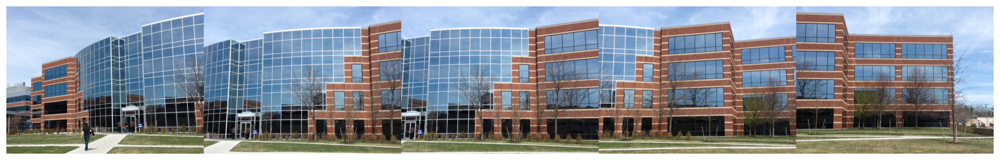

In [17]:
draw_images_in_folder("dataset/building1/")

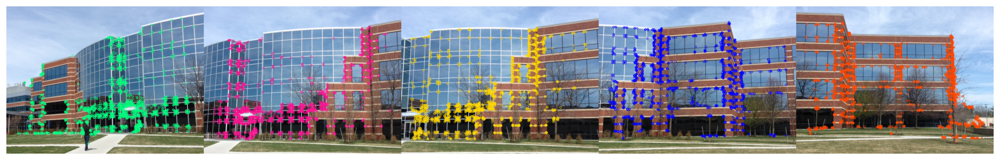

In [18]:
draw_images_in_folder('dataset/building1/', with_points=True)

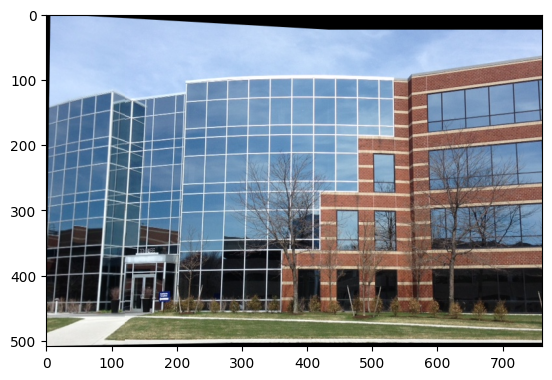

In [19]:
plt.imshow(panorama(img2, img3))


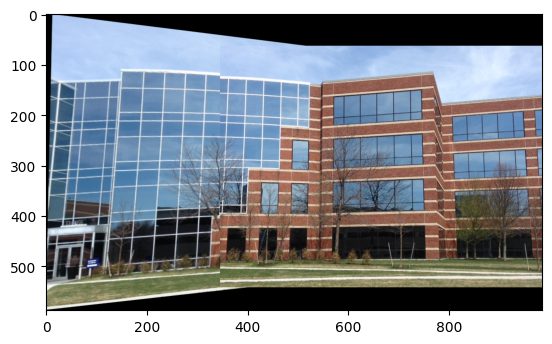

In [20]:
plt.imshow(panorama(img3, img4))

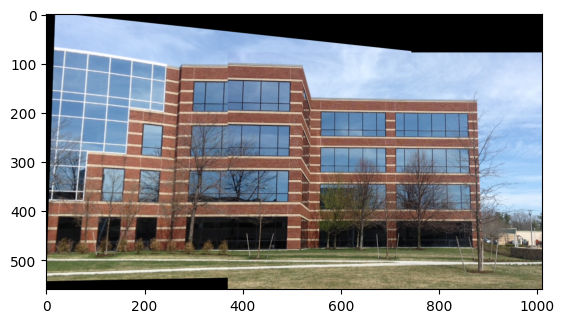

In [21]:
plt.imshow(panorama(img4, img5))

Попробуем склеить все вместе:

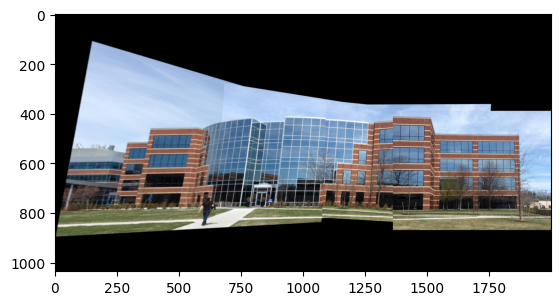

In [22]:
a = panorama(img1, img2)
b = panorama(a, img3, threshold=0.8)
c = panorama(b, img4, threshold=0.85)
result = panorama(c, img5, threshold=0.8)
plt.imshow(result)

* При склеивании попарно все выглядит неплохо
* При склеивании всех изображений получаем вполне приемлемую панораму

## 2. Второе здание

In [23]:
img1 = cv2.imread("dataset/building2/dsc_2705.jpg")
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

img2 = cv2.imread("dataset/building2/dsc_2706.jpg")
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

img3 = cv2.imread("dataset/building2/dsc_2707.jpg")
img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

img4 = cv2.imread("dataset/building2/dsc_2708.jpg")
img4 = cv2.cvtColor(img4, cv2.COLOR_BGR2RGB)

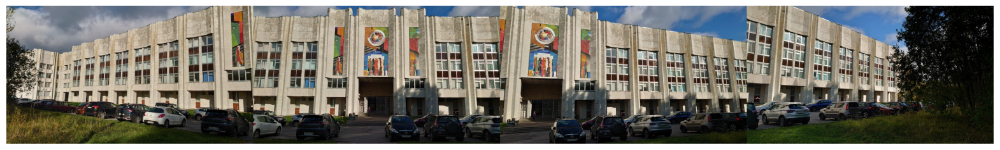

In [24]:
draw_images_in_folder("dataset/building2/")

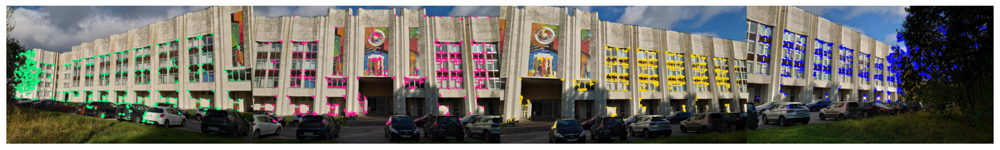

In [25]:
draw_images_in_folder('dataset/building2/', with_points=True)

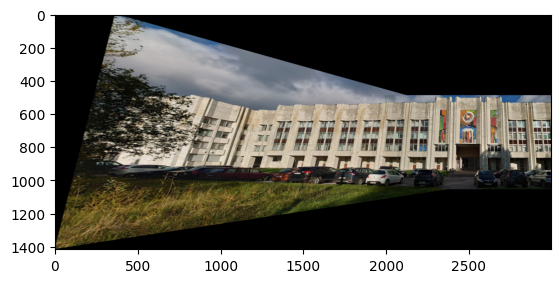

In [26]:
plt.imshow(panorama(img1, img2, ransac_threshold=9.0, threshold=0.9))

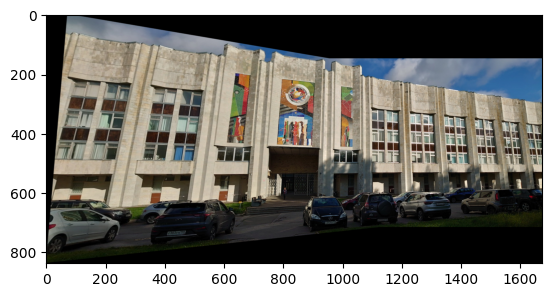

In [27]:
plt.imshow(panorama(img2, img3))

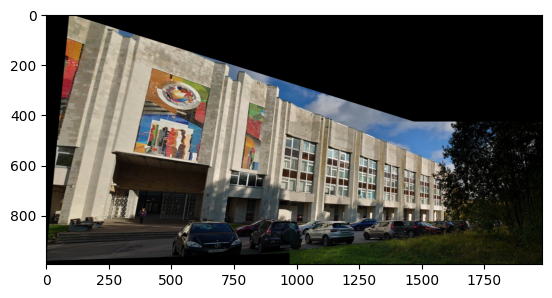

In [28]:
plt.imshow(panorama(img3, img4))

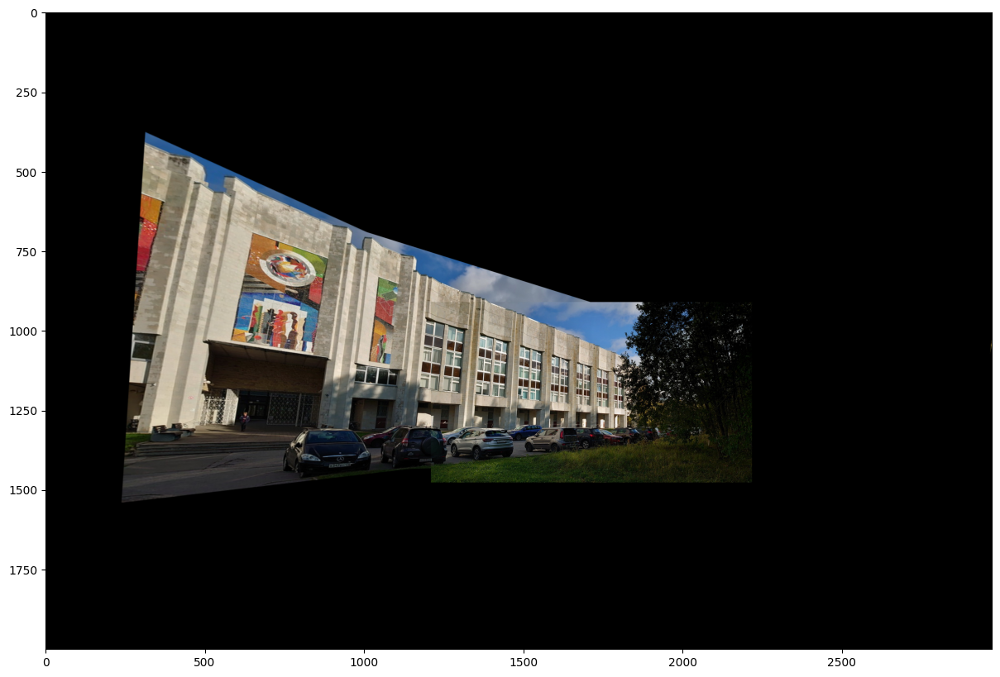

In [48]:
a = panorama(img1, img2)
b = panorama(a, img3, threshold=0.95)
result = panorama(b, img4, threshold=0.95)

plt.figure(figsize=(20, 10))
plt.imshow(result[3000:5000, :, :])

* При склеивании попарно всё выглядит неплохо
* При склеивании всех изображений теряется левая часть

## 3. Третье здание

In [22]:
img1 = cv2.imread("dataset/building3/dsc_2722.jpg")
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

img2 = cv2.imread("dataset/building3/dsc_2723.jpg")
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

img3 = cv2.imread("dataset/building3/dsc_2724.jpg")
img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

img4 = cv2.imread("dataset/building3/dsc_2725.jpg")
img4 = cv2.cvtColor(img4, cv2.COLOR_BGR2RGB)

img5 = cv2.imread("dataset/building3/dsc_2726.jpg")
img5 = cv2.cvtColor(img5, cv2.COLOR_BGR2RGB)

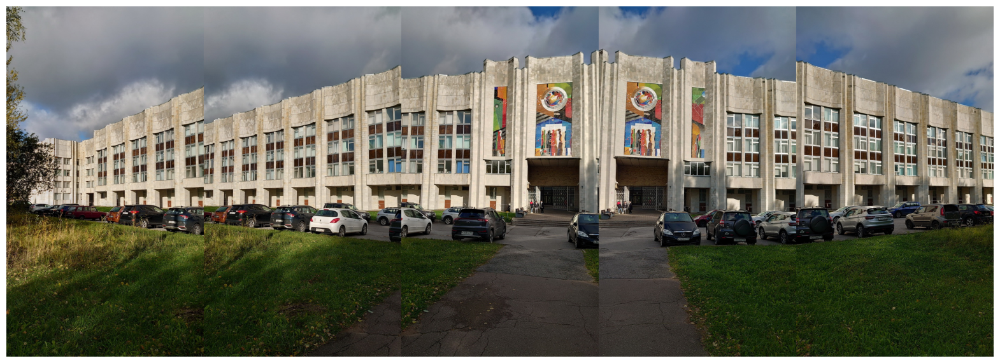

In [10]:
draw_images_in_folder("dataset/building3/", reverse=True)

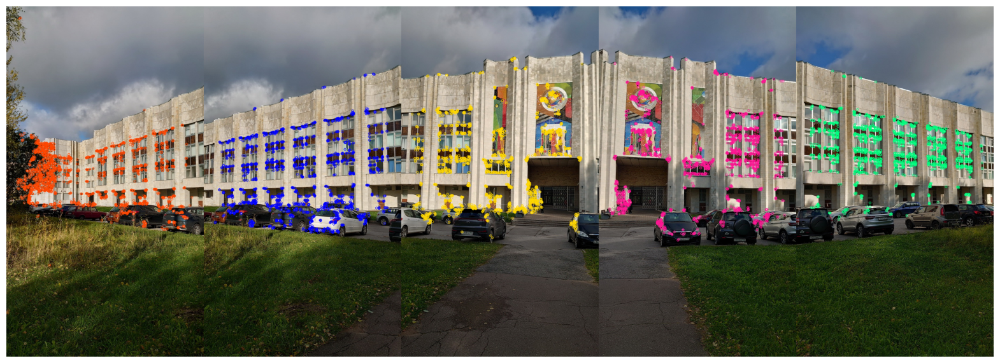

In [11]:
draw_images_in_folder("dataset/building3/", reverse=True, with_points=True)

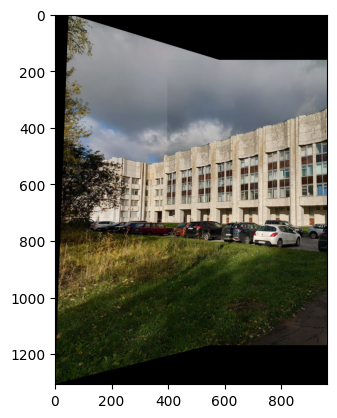

In [13]:
plt.imshow(panorama(img5, img4))

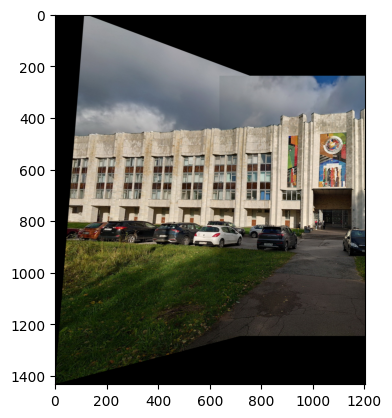

In [14]:
plt.imshow(panorama(img4, img3))

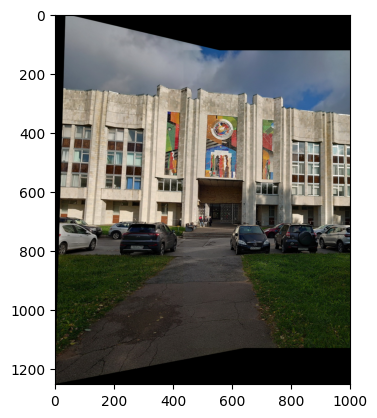

In [15]:
plt.imshow(panorama(img3, img2))

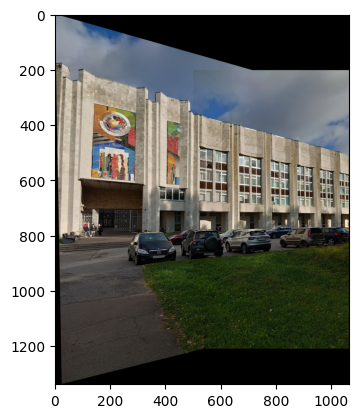

In [16]:
plt.imshow(panorama(img2, img1))

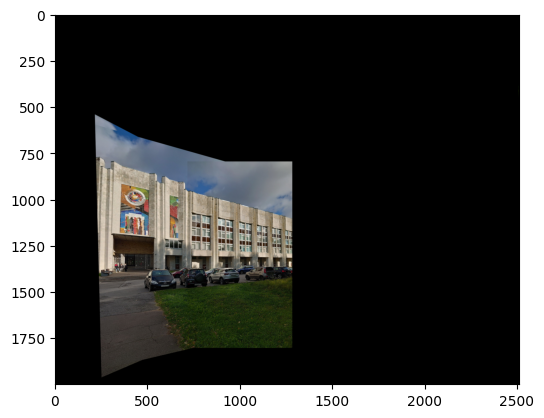

In [25]:
a = panorama(img5, img4)
b = panorama(a, img3)
c = panorama(b, img2)
result = panorama(c, img1)

plt.imshow(result[8000:10000])

* При склеивании попарно все выглядит неплохо
* При склеивании всех изображений наблюдаются некоторые дефекты (теряется левая часть), возможно стоит более тщательно настраивать параметры; 